Material da disciplina de Introdução ao Processamento de Sinais de Voz e Áudio

# Lab. 01 (3Q2019) - Análise de formas de onda, espectros e espectrogramas e alterações na taxa de amostragem de sinais de áudio e voz.

kenji.nose@ufabc.edu.br

Primeira versão: 26/09/2019

Última atualização: 27/09/2019

Objetivos: analisar a forma de onda, os espectros de amplitude e o espectograma de um sinal de audio e realizar alterações na taxa de amostragem (com e sem filtro anti-aliasing) e requantização, de modo a perceber os efeitos e distorções ocasionados.

In [39]:
import scipy.signal as signal
import numpy as np
import scipy
import matplotlib.pyplot as plt
import librosa
from pylab import *
from IPython.display import Audio
from librosa.display import specshow

# Downsampling
def decimate(x, q):
    # Downsample the signal
    sl = [slice(None)] * x.ndim
    sl = slice(None, None, q)

    return x[sl]
  
# Upsampling
def upsample(x, p):
    # upsample the signal
    ylen = p*len(x)
    y    = np.zeros(ylen)
    sl = [slice(None)] * y.ndim
    sl = slice(None, None, p)
    y[sl] = x
    return y
  
#Plot frequency and phase response - adaptado de http://mpastell.com/pweave/_downloads/FIR_design_rst.html
def mfreqz(b,a=1):
    w,h = signal.freqz(b,a)
    h_dB = 20 * log10 (abs(h))
    plt.figure(figsize=(12,6))
    subplot(211)
    plot(w/max(w),abs(h))
    ylim(0, 1.5)
    ylabel('Amplitude')
    xlabel(r'Normalized Frequency (x$\pi$rad/sample)')
    title(r'Frequency response')
    plt.grid(True)
    subplot(212)
    h_Phase = unwrap(arctan2(imag(h),real(h)))
    plot(w/max(w),h_Phase)
    ylabel('Phase (radians)')
    xlabel(r'Normalized Frequency (x$\pi$rad/sample)')
    title(r'Phase response')
    subplots_adjust(hspace=0.5)
    plt.grid(True)

def quantize(x, S):
    X = x.reshape((-1,1))
    S = S.reshape((1,-1))
    dists = abs(X-S)
    
    nearestIndex = dists.argmin(axis=1)
    quantized = S.flat[nearestIndex]
    
    return quantized.reshape(x.shape)

# Abrindo e escutando um sinal de áudio

Para quem estiver utilizando o colab, será necessário fazer o donwload do arquivo "audio.wav", disponível no TIDIA e colocar dentro do seu google drive, em "Colab Notebooks/Audio e Voz/". Caso coloque em outra pasta, as linhas de comando abaixo devem ser ajustada. Caso for utilizar o Jupyter Notebook, será necessário adaptar o código (remover as primeiras linhas e alterar o local do arquivo):

"from google.colab import drive, files \\
drive.mount('/content/drive')"

In [40]:
audio_sample, fs = librosa.load('audio.wav', sr=48000) # 48000 corresponde à taxa de amostragem do sinal

Nos primeiros 3 segundos do arquivo "audio.wav" é possível escutar um sinal de **voz** da letra "u" sendo repetido. No intervalo de 3 a 6 segundos é possível escutar um **violino** sendo tocado. No intervalo de 6 a 9 segundos é possível escutar uma **chave** chacoalhando e nos últimos três segundos do áudio é possível escutar os três sons simultaneamente.

In [41]:
Audio(data=audio_sample, rate=fs)

## Pergunta 1 - Foi possível escutar todos os sons?

# Visualizando a forma de onda

Para visualizar a forma de onda do sinal de áudio pode-se utilizar o código abaixo.

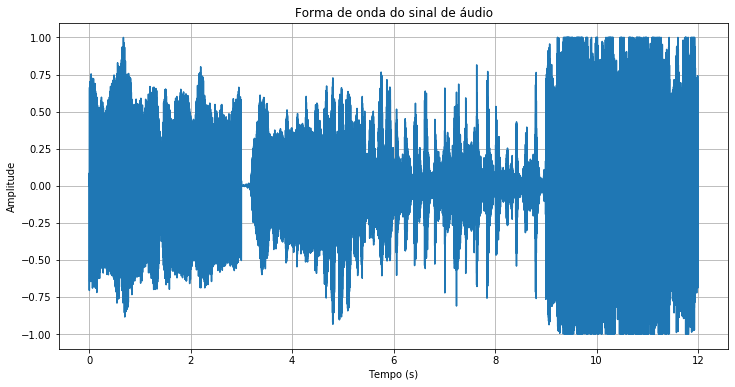

In [42]:
T  = len(audio_sample)/fs
t  = np.linspace(0,T,int(T*fs), endpoint=False)
plt.figure(figsize=(12,6))
plt.plot(t,audio_sample)
plt.title('Forma de onda do sinal de áudio')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True)

## Pergunta 2 - É possível diferenciar os diferentes sons através da sua forma de onda?

# Visualizando o espectro de amplitude

Para visualizar o espectro de amplitude do sinal na escala linear e em dB pode-se utilizar o código abaixo.

(0, 24000.0)

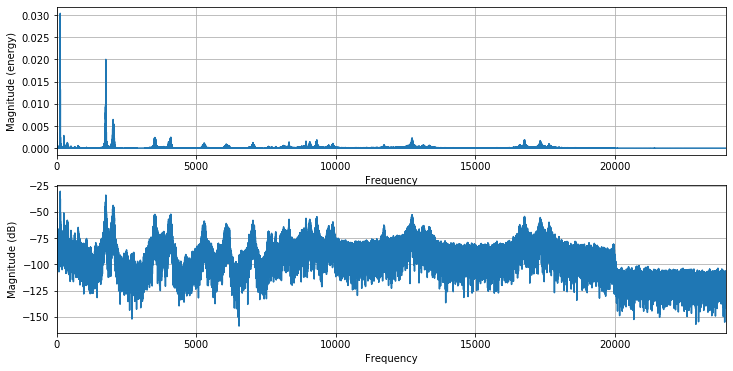

In [43]:
plt.figure(figsize=(12,6))
plt.title('Espectro de amplitude')
plt.subplot(2,1,1)
plt.magnitude_spectrum(audio_sample, Fs=fs)
plt.grid(True)
axes = plt.gca()
axes.set_xlim([0,fs/2])
plt.subplot(2,1,2)
plt.magnitude_spectrum(audio_sample, Fs=fs, scale="dB")
plt.grid(True)
axes = plt.gca()
axes.set_xlim([0,fs/2])

## Pergunta 3 - É possível diferenciar os diferentes sons através do espectro de amplitude? Para você, qual a melhor escala, linear (acima) ou dB (abaixo)?

# Visualizando o espectrograma

Para visualizar o espectrograma do sinal pode-se utilizar o código abaixo.

Text(0, 0.5, 'Frequency [Hz]')

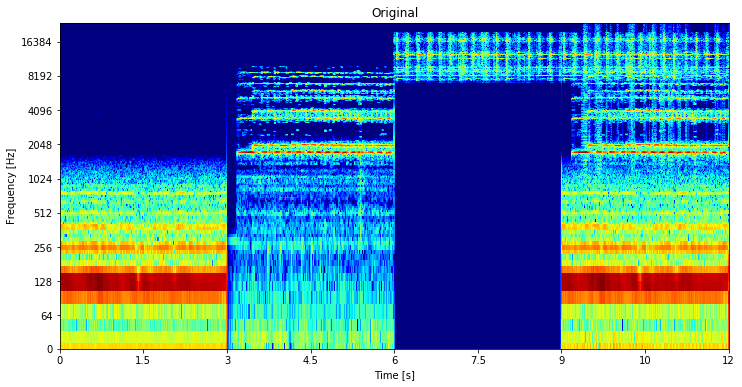

In [44]:
audio_stft = np.abs(librosa.stft(audio_sample))
plt.figure(figsize=(12,6))
specshow(librosa.amplitude_to_db(audio_stft), 
         y_axis='log', 
         x_axis='time',
         cmap='jet', 
         sr=fs)
plt.title('Original')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')

## Pergunta 4 - É possível diferenciar os diferentes sons através do espectrograma?

## Pergunta 5 - Para você, qual ferramenta foi melhor para visualizar os diferentes sons? A forma de onda, o espectro de amplitude ou o espectrograma?

# Reamostrando o sinal de áudio, com e sem filtro anti-aliasing

Vamos definir as seguintes variáveis para armazenar os sinais de áudio:
* s  - sinal de áudio original, com frequência de amostragem fs = 48000
* sr - sinal de áudio reamostrado sem filtro, com frequência de amostragem igual a fs/q, onde q é o fator de decimação;
* x  - sinal de áudio original filtrado, com frequência de amostragem igual a fs = 48000
* xr - sinal de áudio reamostrado com filtro anti-aliasing, com frequência de amostragem igual a fs/q, onde q é o fator de decimação; 

Para um fator de decimação q, vamos definir um filtro anti-aliasing com frequência angular $\omega = \pi/q$ e ordem igual a $20*q$. Neste primeiro caso, iermos utilizar um fator de decimação igual a 2.

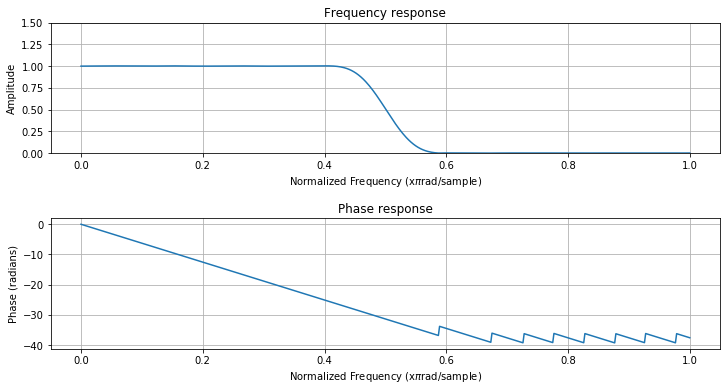

In [45]:
q   = 2;
fpb = signal.firwin(20*q+1, cutoff = 1/q, window = "hamming") # cutoff 
#Frequency and phase response
mfreqz(fpb)

In [46]:
s  = audio_sample
x  = np.convolve(fpb,s,'same')
sr = decimate(s,q)
xr = decimate(x,q)
tr = np.linspace(0,len(xr),len(xr), endpoint=False)
fr = fs/q
tr = tr/fs
Audio(data=s, rate=fs)

In [47]:
Audio(data=x, rate=fs)

In [48]:
Audio(data=sr, rate=fr)


In [49]:
Audio(data=xr, rate=fr)

## Pergunta 6 - É possível perceber alguma diferença entre os sons de s (original) e de x (filtrado)?


## Pergunta 7 - É possível perceber alguma diferença entre os sons de s (original) e de sr (reamostrado)?

## Pergunta 8 - É possível perceber alguma diferença entre os sons de x (filtrado) e de xr (filtrado e reamostrado)?

(0, 24000.0)

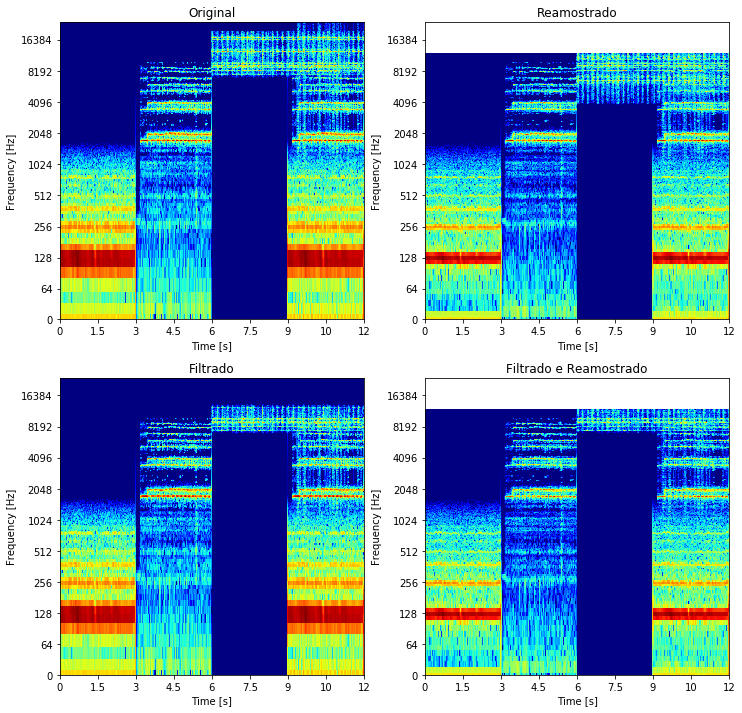

In [50]:
s_stft = np.abs(librosa.stft(s))
x_stft = np.abs(librosa.stft(x))
sr_stft = np.abs(librosa.stft(sr))
xr_stft = np.abs(librosa.stft(xr))
plt.figure(figsize=(12,12))
plt.subplot(2,2,1)
specshow(librosa.amplitude_to_db(s_stft), 
         y_axis='log', 
         x_axis='time',
         cmap='jet', 
         sr=fs)
plt.title('Original')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.ylim(0, fs/2)

plt.subplot(2,2,3)
specshow(librosa.amplitude_to_db(x_stft), 
         y_axis='log', 
         x_axis='time',
         cmap='jet', 
         sr=fs)
plt.title('Filtrado')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.ylim(0, fs/2)

plt.subplot(2,2,2)
specshow(librosa.amplitude_to_db(sr_stft), 
         y_axis='log', 
         x_axis='time',
         cmap='jet', 
         sr=fr)
plt.title('Reamostrado')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.ylim(0, fs/2)

plt.subplot(2,2,4)
specshow(librosa.amplitude_to_db(xr_stft), 
         y_axis='log', 
         x_axis='time',
         cmap='jet', 
         sr=fr)
plt.title('Filtrado e Reamostrado')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.ylim(0, fs/2)

## Pergunta 9 - Analisando os espectrogramas, é possível perceber o efeito de alising? Se sim, qual som ou sons (voz, violino e/ou chave) são os mais afetados?


## Repita os exercícios relativos às perguntas 6, 7, 8, e 9 considerando q = 4 e q = 6.

# Requantizando o sinal de áudio

Para quantizar/requantizar um sinal de áudio é necessário definir o quantizador que será utilizado, o número de bits $b$ que será utilizado na codificação e a amplitude máxima do valor absoluto do sinal $U$ que será quantizado.

Neste exemplo, será utilizado um quantizador do tipo Mid-rise, com $U=1$ e iremos variar o número de bits que será utilizado na quantização. O áudio utilizado neste laboratório foi quantizado originalmente com 16bits.

Vamos definir as seguintes variáveis para armazenar os sinais de áudio:
* s  - sinal de áudio original;
* sq - sinal de áudio requantizado

Primeiramente, vamos requantizar este sinal com 8 bits.

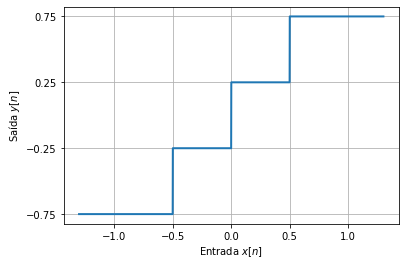

In [51]:
b = 2            # número de bits que será utilizado na quantização
U = 1            # amplitude máxima do sinal que será quantizado
L = 2**b         # número de níveis(intervalo) que será  utilizado na quantização
Delta_s   = 2*U/L  # passo de quantização
S_midrise = -U + Delta_s/2 + np.arange(L)*Delta_s # calcula os intervalos de quantização
sq = quantize(s, S_midrise)
e  = sq-s

In          = np.linspace(-1.3*U, 1.3*U, 2000)
Out_midrise = quantize(In, S_midrise)
plt.plot(In, Out_midrise, lw=2, label='mid-rise');
plt.xlabel('Entrada $x[n]$')
plt.ylabel('Saída $y[n]$')
plt.grid(True)
plt.yticks(S_midrise);

(10, 10.005)

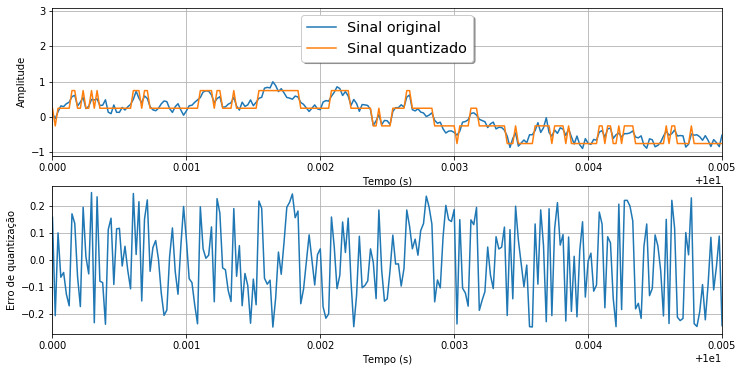

In [52]:
plt.figure(figsize=(12,6))
plt.subplot(2,1,1)
plt.plot(t,s,label='Sinal original')
plt.plot(t,sq,label='Sinal quantizado')
legend(loc='upper center', shadow=True, fontsize='x-large');
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True)
axes = plt.gca()
axes.set_ylim([-1.1,3.1])
axes.set_xlim([10,10.005])
plt.subplot(2,1,2)
plt.plot(t,e)
plt.xlabel('Tempo (s)')
plt.ylabel('Erro de quantização')
plt.grid(True)
axes = plt.gca()
axes.set_xlim([10,10.005])

In [53]:
Audio(data=s, rate=fs)

In [54]:
Audio(data=sq, rate=fs)

In [55]:
Audio(data=e, rate=fs)

(0, 24000.0)

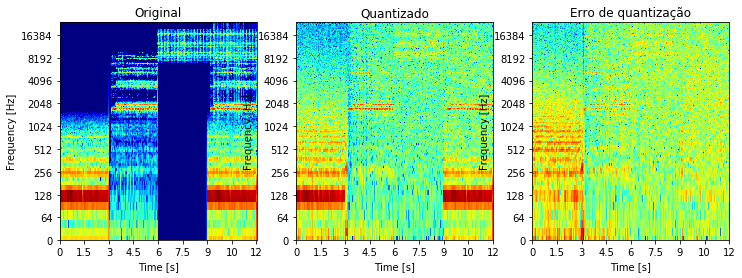

In [56]:
s_stft = np.abs(librosa.stft(s))
sq_stft = np.abs(librosa.stft(sq))
e_stft = np.abs(librosa.stft(e))
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
specshow(librosa.amplitude_to_db(s_stft), 
         y_axis='log', 
         x_axis='time',
         cmap='jet', 
         sr=fs)
plt.title('Original')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.ylim(0, fs/2)

plt.subplot(1,3,2)
specshow(librosa.amplitude_to_db(sq_stft), 
         y_axis='log', 
         x_axis='time',
         cmap='jet', 
         sr=fs)
plt.title('Quantizado')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.ylim(0, fs/2)

plt.subplot(1,3,3)
specshow(librosa.amplitude_to_db(e_stft), 
         y_axis='log', 
         x_axis='time',
         cmap='jet', 
         sr=fs)
plt.title('Erro de quantização')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.ylim(0, fs/2)

# Pergunta 10 - Após a quantização, é possível perceber alguma difereça nos áudios? Se sim, qual ou quais áudios? É possível nota alguma diferença nos espectogramas?

## Repita os exercícios relativos à pergunta 10 considerando b = 4 e b = 2.

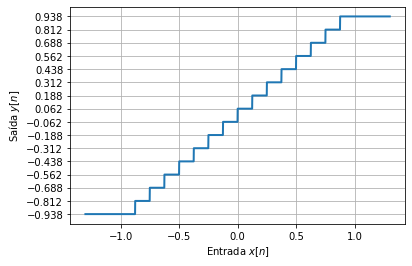

In [57]:
b_4 = 4            # número de bits que será utilizado na quantização
U = 1            # amplitude máxima do sinal que será quantizado
L = 2**b_4         # número de níveis(intervalo) que será  utilizado na quantização
Delta_s   = 2*U/L  # passo de quantização
S_midrise = -U + Delta_s/2 + np.arange(L)*Delta_s # calcula os intervalos de quantização
sq = quantize(s, S_midrise)
e  = sq-s

In          = np.linspace(-1.3*U, 1.3*U, 2000)
Out_midrise = quantize(In, S_midrise)
plt.plot(In, Out_midrise, lw=2, label='mid-rise');
plt.xlabel('Entrada $x[n]$')
plt.ylabel('Saída $y[n]$')
plt.grid(True)
plt.yticks(S_midrise);

(10, 10.005)

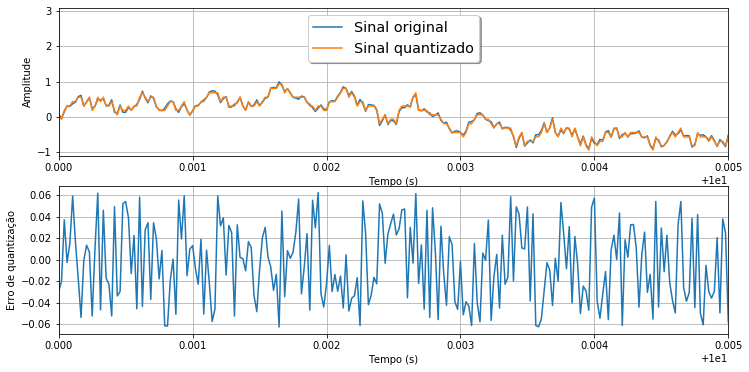

In [58]:
plt.figure(figsize=(12,6))
plt.subplot(2,1,1)
plt.plot(t,s,label='Sinal original')
plt.plot(t,sq,label='Sinal quantizado')
legend(loc='upper center', shadow=True, fontsize='x-large');
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True)
axes = plt.gca()
axes.set_ylim([-1.1,3.1])
axes.set_xlim([10,10.005])
plt.subplot(2,1,2)
plt.plot(t,e)
plt.xlabel('Tempo (s)')
plt.ylabel('Erro de quantização')
plt.grid(True)
axes = plt.gca()
axes.set_xlim([10,10.005])

In [59]:
Audio(data=sq, rate=fs)

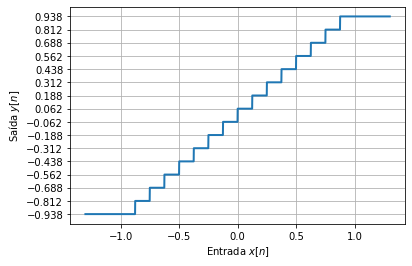

In [61]:
b_8 = 8          # número de bits que será utilizado na quantização
U = 1            # amplitude máxima do sinal que será quantizado
L = 2**b_8         # número de níveis(intervalo) que será  utilizado na quantização
Delta_s   = 2*U/L  # passo de quantização
S_midrise = -U + Delta_s/2 + np.arange(L)*Delta_s # calcula os intervalos de quantização
sq = quantize(s, S_midrise)
e  = sq-s

In          = np.linspace(-1.3*U, 1.3*U, 2000)
Out_midrise = quantize(In, S_midrise)
plt.plot(In, Out_midrise, lw=2, label='mid-rise');
plt.xlabel('Entrada $x[n]$')
plt.ylabel('Saída $y[n]$')
plt.grid(True)
plt.yticks(S_midrise);

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(2,1,1)
plt.plot(t,s,label='Sinal original')
plt.plot(t,sq,label='Sinal quantizado')
legend(loc='upper center', shadow=True, fontsize='x-large');
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.grid(True)
axes = plt.gca()
axes.set_ylim([-1.1,3.1])
axes.set_xlim([10,10.005])
plt.subplot(2,1,2)
plt.plot(t,e)
plt.xlabel('Tempo (s)')
plt.ylabel('Erro de quantização')
plt.grid(True)
axes = plt.gca()
axes.set_xlim([10,10.005])

In [ ]:
Audio(data=sq, rate=fs)